# Preprocess data

In [1]:
import os
import shutil
import glob
from PIL import Image
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import splitfolders

import tensorflow as tf

tf.__version__

'2.5.0'

In [2]:
should_prepare_data = True

In [3]:
def prepare_data():
    
    dirpaths = []

    for dirpath, _, _ in os.walk('./data/beer_labels/'):
        dirpaths.append(dirpath)

    # Move and rename files and folders
    j = 1  # no. of folder/class

    for dirpath in dirpaths[1:]:

        dst_dir = './data/input_beer_labels'

        if not os.path.exists(dst_dir):
            os.mkdir(dst_dir)

        i = 1  # no. of image

        for jpg_file in glob.iglob(os.path.join(dirpath, '*.jpg')):

            img_path = os.path.join(dst_dir, 'class{}'.format(j))

            if not os.path.exists(img_path):
                os.mkdir(img_path)

            new_name = 'class{}/{}_{}.jpg'.format(j, j, i)

            shutil.copy(jpg_file, os.path.join(dst_dir, new_name))

            i += 1

        j += 1

    # split images to train/val/test folders
    # where 50% of it is for training
    splitfolders.ratio('./data/input_beer_labels', output='./data/output_beer_labels', seed=1337, ratio=(.5, .25, .25))


In [4]:
if should_prepare_data:
    prepare_data()

Copying files: 8007 files [00:00, 8856.96 files/s]


# Define train/val/test sets

In [5]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [6]:
batch_size = 32
img_height = 240
img_width = 240

In [7]:
data_dir = './data/output_beer_labels/train/'
val_dir = './data/output_beer_labels/val/'
test_dir = './data/output_beer_labels/test//'

In [8]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(data_dir,
                                                               label_mode='int',
                                                               batch_size=batch_size,
                                                               image_size=(img_height, img_width))


Found 3981 files belonging to 100 classes.


In [9]:
validation_ds = tf.keras.preprocessing.image_dataset_from_directory(val_dir,
                                                                  label_mode='int',
                                                                  batch_size=batch_size,
                                                                  image_size=(img_height, img_width))


Found 1988 files belonging to 100 classes.


In [10]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                              label_mode='int',
                                                              batch_size=batch_size,
                                                              image_size=(img_height, img_width))


Found 2038 files belonging to 100 classes.


In [11]:
num_classes = 100

# Deep learning model

## Model architecture and compilation

In [12]:
model = tf.keras.Sequential([
    
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    
    layers.Conv2D(16, (3,3), padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),
        
    layers.Conv2D(32, (3,3), padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),
    
    layers.Conv2D(64, (3,3), padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),
    
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(num_classes)                                                      
])

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 240, 240, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 240, 240, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 120, 120, 16)      0         
_________________________________________________________________
dropout (Dropout)            (None, 120, 120, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 120, 120, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 60, 60, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 60, 60, 32)        0

In [14]:
epochs = 30

## Callbacks

In [15]:
def best_val_acc_callback(filepath):
    
    checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath, 
        monitor='val_accuracy', 
        verbose=1, 
        save_best_only=True,
        save_weights_only=True, 
        mode='max', 
        save_freq='epoch')

    
    return checkpoint_callback




In [16]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                 mode='max',
                                                 patience=3)

checkpoint_path = './saved_weights/flowers/analiza_bledow'

best_val_acc = best_val_acc_callback(checkpoint_path)

## Fit the model

In [17]:
history = model.fit(
    train_ds,
    validation_data=validation_ds,
    epochs=epochs,
    callbacks=[early_stopping, best_val_acc]
)


Epoch 1/30
125/125 [==============================] - 7s 41ms/step - loss: 4.2328 - accuracy: 0.0934 - val_loss: 4.4904 - val_accuracy: 0.0377

Epoch 00001: val_accuracy improved from -inf to 0.03773, saving model to ./saved_weights/flowers/analiza_bledow
Epoch 2/30
125/125 [==============================] - 5s 38ms/step - loss: 3.5270 - accuracy: 0.2605 - val_loss: 4.4209 - val_accuracy: 0.0770

Epoch 00002: val_accuracy improved from 0.03773 to 0.07696, saving model to ./saved_weights/flowers/analiza_bledow
Epoch 3/30
125/125 [==============================] - 5s 38ms/step - loss: 2.9726 - accuracy: 0.4474 - val_loss: 4.1628 - val_accuracy: 0.1132

Epoch 00003: val_accuracy improved from 0.07696 to 0.11318, saving model to ./saved_weights/flowers/analiza_bledow
Epoch 4/30
125/125 [==============================] - 5s 39ms/step - loss: 2.4501 - accuracy: 0.6282 - val_loss: 3.8082 - val_accuracy: 0.1846

Epoch 00004: val_accuracy improved from 0.11318 to 0.18461, saving model to ./save

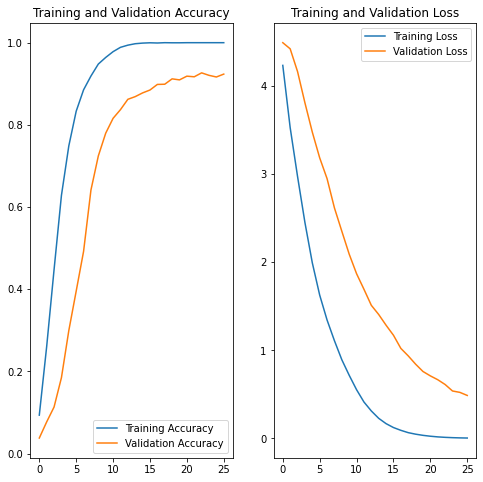

In [18]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.epoch))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [19]:
model.load_weights(checkpoint_path)

In [20]:
model.evaluate(test_ds)

64/64 [==============================] - 1s 15ms/step - loss: 0.6071 - accuracy: 0.9195


[0.6071180105209351, 0.9195289611816406]

# Model interpretation

## GradCAM

In [21]:
import tensorflow.keras.backend as K
import cv2
import numpy as np

In [22]:
# select all the layers for which you want to visualize the outputs and store it in a list
outputs = [layer.output for layer in model.layers[:]]

# Define a new model that generates the above output
vis_model = tf.keras.Model(model.input, outputs)

# store the layer names we are interested in
layer_names = []
for layer in outputs:
    layer_names.append(layer.name.split("/")[0])

    
print("Layers that will be used for visualization: ")
print(layer_names)

Layers that will be used for visualization: 
['rescaling', 'conv2d', 'max_pooling2d', 'dropout', 'conv2d_1', 'max_pooling2d_1', 'dropout_1', 'conv2d_2', 'max_pooling2d_2', 'dropout_2', 'flatten', 'dense', 'batch_normalization', 'dense_1']


In [24]:
layer_names[9]

'dropout_2'

In [23]:
def get_CAM(processed_image, actual_label, layer_name=layer_names[9]):
    
    model_grad = tf.keras.Model([model.inputs], 
                               [model.get_layer(layer_name).output, model.output])
    
    with tf.GradientTape() as tape:
        conv_output_values, predictions = model_grad(processed_image)

        # watch the conv_output_values
        tape.watch(conv_output_values)

        ## Use binary cross entropy loss
        ## actual_label is 0 if cat, 1 if dog
        # get prediction probability of dog
        # If model does well, 
        # pred_prob should be close to 0 if cat, close to 1 if dog
        pred_prob = predictions[:,1] 
        
        # make sure actual_label is a float, like the rest of the loss calculation
        actual_label = tf.cast(actual_label, dtype=tf.float32)
        
        # add a tiny value to avoid log of 0
        smoothing = 0.00001 
        
        # Calculate loss as binary cross entropy
        loss = -1 * (actual_label * tf.math.log(pred_prob + smoothing) + (1 - actual_label) * tf.math.log(1 - pred_prob + smoothing))
#         print(f"binary loss: {loss}")
    
    # get the gradient of the loss with respect to the outputs of the last conv layer
    grads_values = tape.gradient(loss, conv_output_values)
    grads_values = K.mean(grads_values, axis=(0,1,2))
    
    conv_output_values = np.squeeze(conv_output_values.numpy())
    grads_values = grads_values.numpy()
    
    # weight the convolution outputs with the computed gradients
    for i in range(32): 
        conv_output_values[:,:,i] *= grads_values[i]
    heatmap = np.mean(conv_output_values, axis=-1)
    
    heatmap = np.maximum(heatmap, 0)
    heatmap /= heatmap.max()
    
    del model_grad, conv_output_values, grads_values, loss
   
    return heatmap

In [25]:
def show_sample(idx=None):
    
    # if image index is specified, get that image
    if idx:
        for img, label in test_ds.take(idx):
            sample_image = img[0]
            sample_label = label[0]
    # otherwise if idx is not specified, get a random image
    else:
        for img, label in test_ds.shuffle(1000).take(1):
            sample_image = img[0]
            sample_label = label[0]
    
    sample_image_processed = np.expand_dims(sample_image, axis=0)
    
    activations = vis_model.predict(sample_image_processed)
    
    pred_label = np.argmax(model.predict(sample_image_processed), axis=-1)[0]
    
    sample_activation = activations[0][0,:,:,2]
    
    sample_activation-=sample_activation.mean()
    sample_activation/=sample_activation.std()
    
    sample_activation *= 255
    sample_activation = np.clip(sample_activation, 0, 255).astype(np.uint8)
    
    heatmap = get_CAM(sample_image_processed, sample_label)
    heatmap = cv2.resize(heatmap, (sample_image.shape[0], sample_image.shape[1]))
    heatmap = heatmap * 255
    heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT)
    
    converted_img = sample_image.numpy() / 255.
    
    super_imposed_image = cv2.addWeighted(converted_img, 0.8, heatmap.astype('float32'), 2e-3, 0.0)

    f,ax = plt.subplots(2,2, figsize=(15,8))

    ax[0,0].imshow(sample_image / 255.)
    ax[0,0].set_title(f"True label: {sample_label} \n Predicted label: {pred_label}")
    ax[0,0].axis('off')
    
    ax[0,1].imshow(sample_activation)
    ax[0,1].set_title("Random feature map")
    ax[0,1].axis('off')
    
    ax[1,0].imshow(heatmap)
    ax[1,0].set_title("Class Activation Map")
    ax[1,0].axis('off')
    
    ax[1,1].imshow(super_imposed_image)
    ax[1,1].set_title("Activation map superimposed")
    ax[1,1].axis('off')
    plt.tight_layout()
    plt.show()
  
    return activations

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


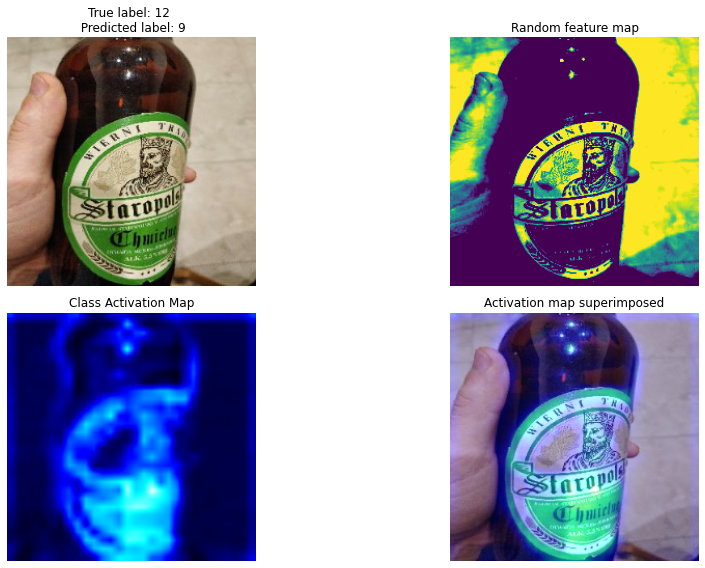

In [26]:
# Choose an image index to show, or leave it as None to get a random image

activations = show_sample(idx=None)

In [58]:
def show_gradcam(sample_image, sample_label, every_class_images=None):
    
    '''
    Function shows in one row four images: 
        * image used for making prediction
        * class activation map
        * activation map superimposed
        * image of class which alrgorith predicted
    
    Recommended to display wrongly classified images.
    
    Source:
    https://www.coursera.org/learn/advanced-computer-vision-with-tensorflow/ungradedLab/Y43NS/gradcam-lab-4
    '''

    sample_image_processed = np.expand_dims(sample_image, axis=0)
    
    activations = vis_model.predict(sample_image_processed)
    
    pred_label = np.argmax(model.predict(sample_image_processed), axis=-1)[0]
    
    sample_activation = activations[0][0,:,:,:]
    
    sample_activation-=sample_activation.mean()
    sample_activation/=sample_activation.std()
    
    sample_activation *=255
    sample_activation = np.clip(sample_activation, 0, 255).astype(np.uint8)
    
    heatmap = get_CAM(sample_image_processed, sample_label)
    heatmap = cv2.resize(heatmap, (sample_image.shape[0], sample_image.shape[1]))
    heatmap = heatmap * 255
    heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT)
    
    converted_img = sample_image.numpy() / 255.
    
    super_imposed_image = cv2.addWeighted(converted_img, 0.8, heatmap.astype('float32'), 2e-3, 0.0)     
    
    sample_image /= 255.
    
    f,ax = plt.subplots(1,4, figsize=(12,6))
    
    ax[0].imshow(sample_image)
    ax[0].set_title(f"True label: {sample_label} \n Predicted label: {pred_label}")
    ax[0].axis('off')

    ax[1].imshow(heatmap)
    ax[1].set_title("Class Activation Map")
    ax[1].axis('off')
    
    ax[2].imshow(super_imposed_image)
    ax[2].set_title("Activation map superimposed")
    ax[2].axis('off')
    
    ax[3].imshow(every_class_images[pred_label] / 255.)
    ax[3].set_title(f"Image of {pred_label} class")
    ax[3].axis('off')

    plt.tight_layout()
    plt.show()

In [28]:
# x, y = next(iter(test_ds))
# image = x[0]
# true_index = y[0]

# plt.imshow(image/255.)
# plt.axis('off')
# plt.show()


# # Expand the validation image to (1, 224, 224, 3) before predicting the label
# prediction_scores = model.predict(np.expand_dims(image, axis=0))
# predicted_index = np.argmax(prediction_scores)
# print(f"True label: {true_index}")
# print(f"Predicted label: {predicted_index}")


In [29]:
# x, y = next(iter(test_ds))

# for i in range(31):
    
#     if y[i]==32:
#         plt.imshow(x[i]/255.)
#         plt.title(f'Class label: {y[i]}')
#         plt.axis('off')
#         plt.show()

In [30]:
# y_pred = model.predict(test_ds)
# y_pred.shape

In [31]:
# y_pred[54, :]

In [32]:
# print(f'{np.max(y_pred[54])}, {np.argmax(y_pred[54])}')

In [33]:
#  for img, label in test_ds.shuffle(1000).take(1):
#             sample_image = img[0]
#             sample_label = label[0]

In [34]:
# test_ds

## Classes with incorrectly classified images from test dataset

In [35]:
one_batch_test_ds = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                        label_mode='int',
                                                                        batch_size=530,
                                                                        image_size=(img_height, img_width))

Found 2038 files belonging to 100 classes.


In [36]:
full_test_ds = list(next(iter(one_batch_test_ds)))

In [37]:
full_test_ds[0].shape

TensorShape([530, 240, 240, 3])

In [38]:
full_test_ds[1].shape

TensorShape([530])

In [39]:
y_true = full_test_ds[1]
y_pred = model.predict(full_test_ds[0])

In [40]:
test_images = full_test_ds[0]

In [41]:
# create list consisting of 42 images representing 42 classes

every_class_img = np.ndarray((num_classes,img_height, img_width,3))

for label in range(num_classes):
    
    for idx in range(530):
        
        if y_true[idx] == label:
            
            every_class_img[label] = test_images[idx]
            
            

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


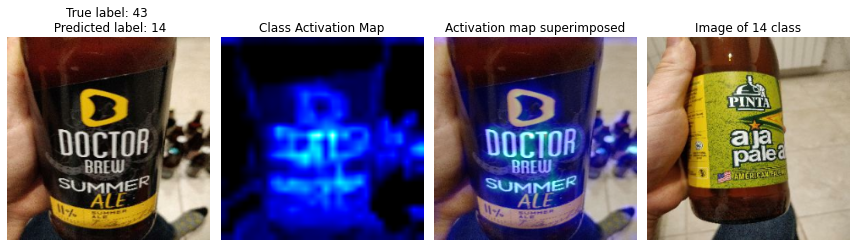

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


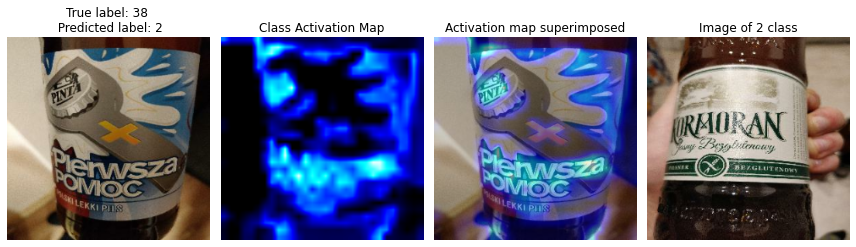

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


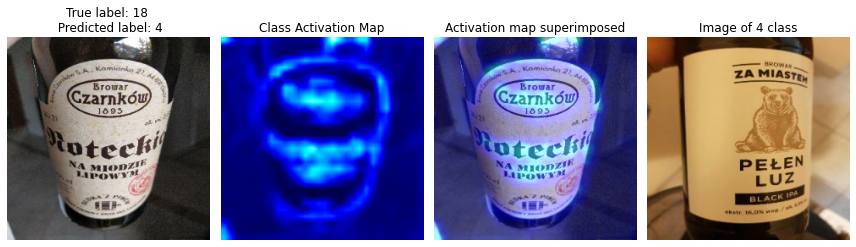

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


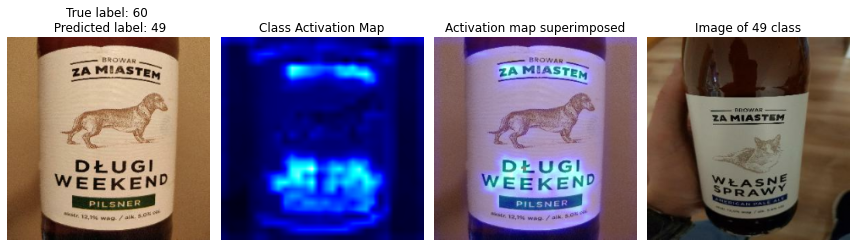

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


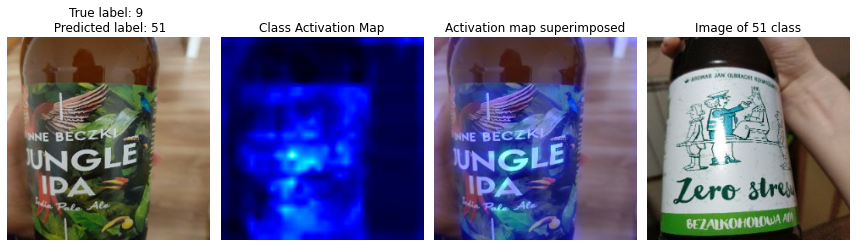

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


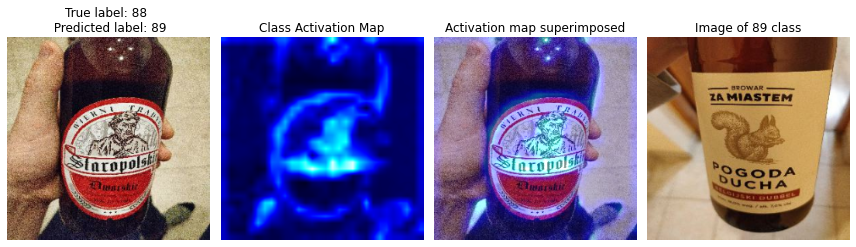

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


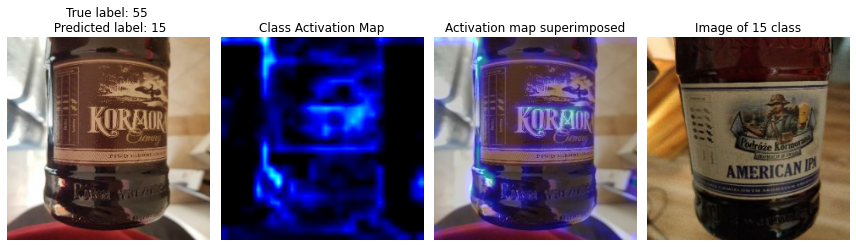

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


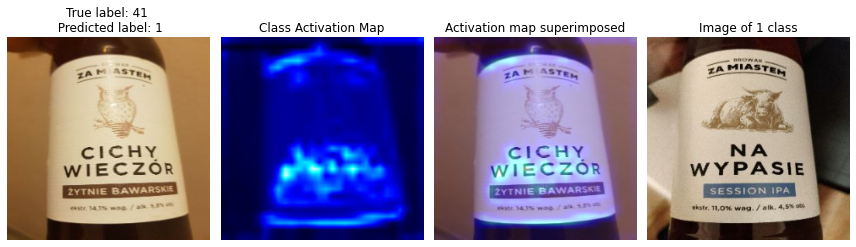

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


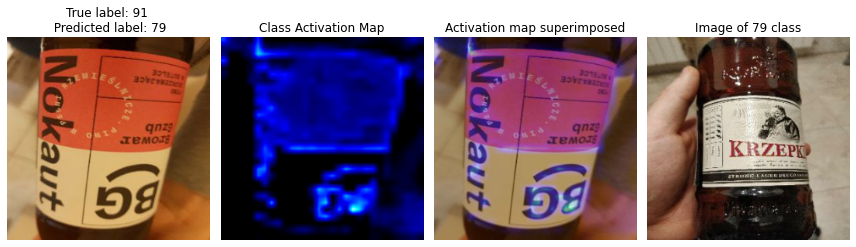

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


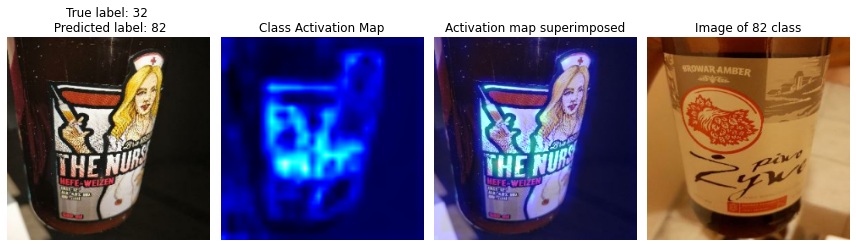

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


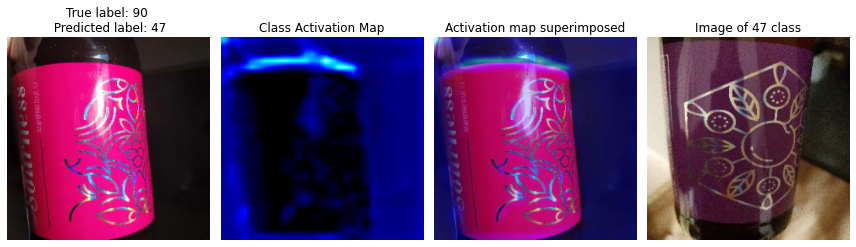

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


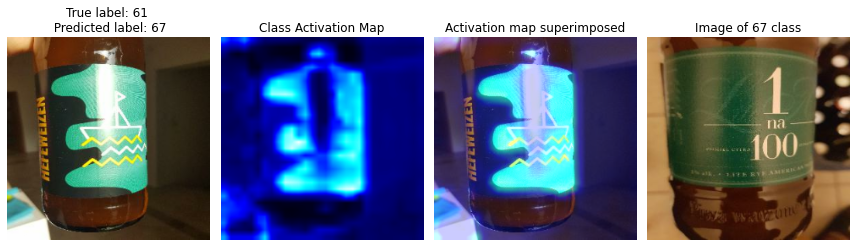

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


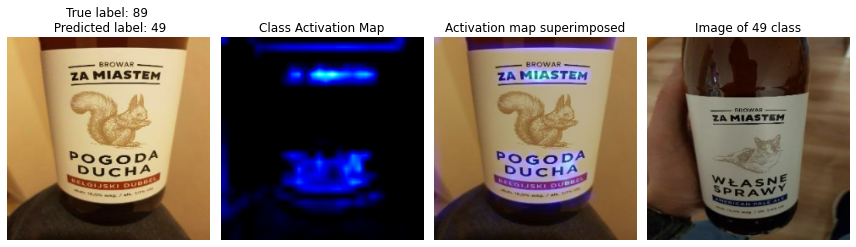

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


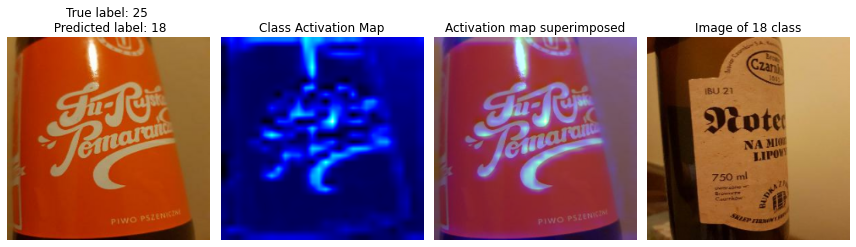

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


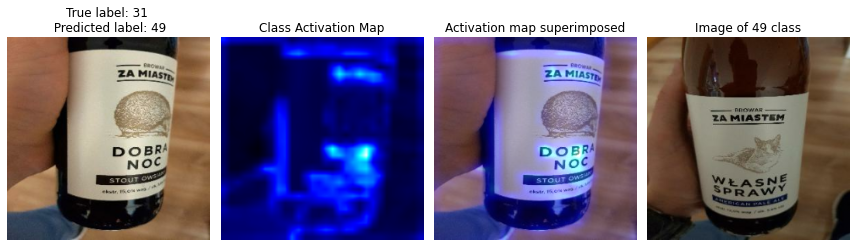

In [59]:
wrong_pred_idx = []

displayed_img_count = 0

for i in range(530):

    if np.argmax(y_pred[i]) != y_true[i]:
        
        image = full_test_ds[0][i]
        true_label = y_true[i]
        
        if displayed_img_count < 15:
            show_gradcam(image, true_label, every_class_img)
        displayed_img_count += 1
        
        wrong_pred_idx.append(i)
        
        

## Conclusions based on GradCAM

### 1.

There are few beer labels which are very similar with difference an animal in the middle of the label and name of a beer.

Model does not recognize the animal. It may be caused by it being less distinctive than black letters next to it, which are apparently mainly used for recognition of this particular set of labels.

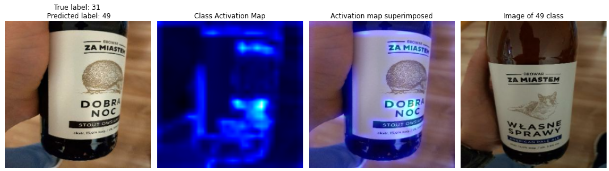

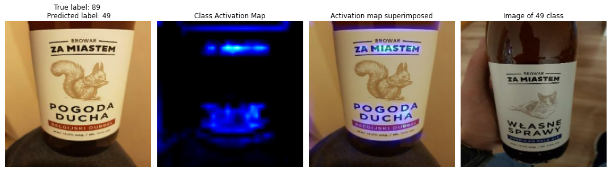

### 2.

In example below, class label has reflection in important part of the label and this reflection leads to it not being visible to alrogorith. Both predicted and true labels have the same color. In the place of reflections class 67 has letters denoting beer name. 

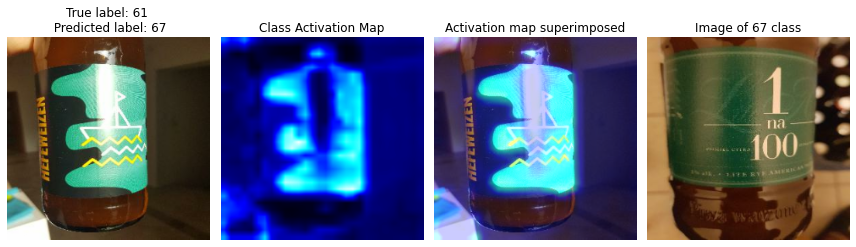

### 3. 
Here both labels have alike designs (strip at the bottom, similar fonts) and bottles. Maybe if both labels were photographed with better lighting, hence edges would be better visible, model would predict correct classes. 

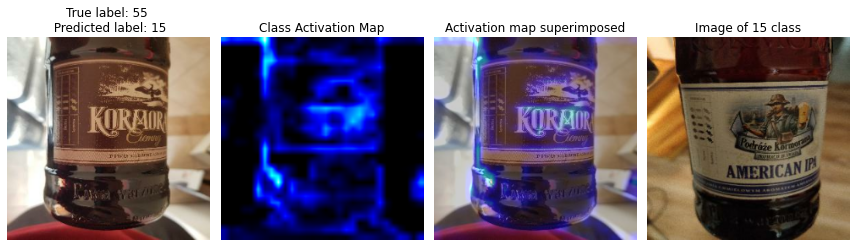

### 4.

In this case model is totally blind.

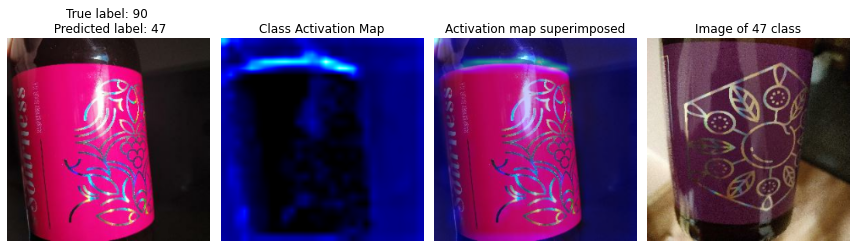

Other image of class 90, where bottle is not rotated and lighting is different. 
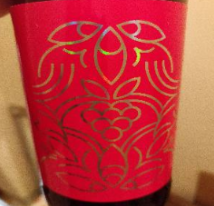

In [43]:
wrong_pred_classes = []

for idx in wrong_pred_idx:
    wrong_pred_classes.append(y_true[idx])


38 in total among 30 classes.


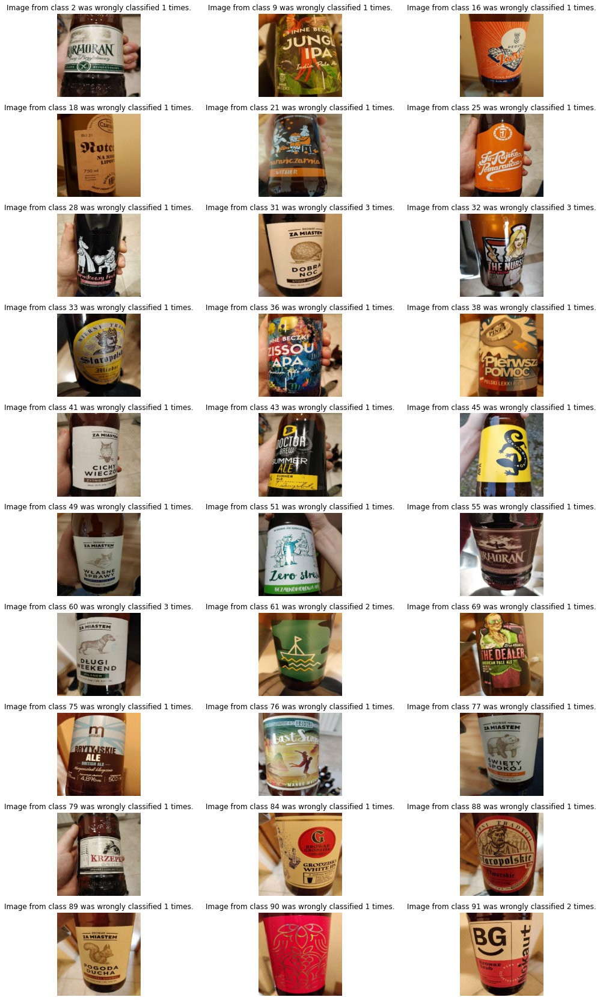

In [109]:
data = {'class': [],
       'count': []}

total = 0

for i in range(num_classes):
    
    cnt = wrong_pred_classes.count(i)
    
    if cnt > 0:
        
        data['class'].append(i)
        data['count'].append(cnt)
        total += cnt
        
in_classes = len(data['class'])
        
print(f'\n{total} in total among {in_classes} classes.')

plt.figure(figsize=(17, 30))

for i, class_num in enumerate(data['class']):
    
    cnt = data['count'][i]
    
    ax = plt.subplot(10, 3, i + 1)
    plt.imshow(every_class_img[class_num] / 255.)
    plt.title(f'Image from class {class_num} was wrongly classified {cnt} times.',
             fontsize=12)
    plt.axis("off")
 

In [110]:
df = pd.DataFrame(data)
df.head()

,class,count
0,2,1
1,9,1
2,16,1
3,18,1
4,21,1


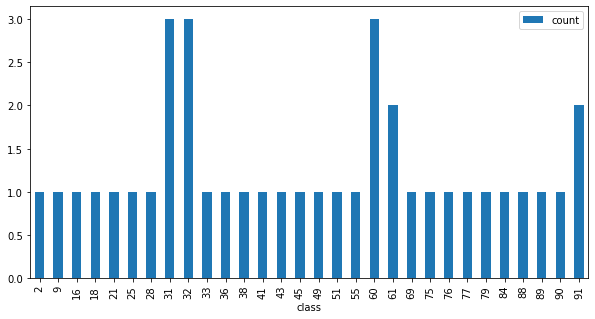

In [111]:
df.plot.bar(x='class', y='count', figsize=(10,5));

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


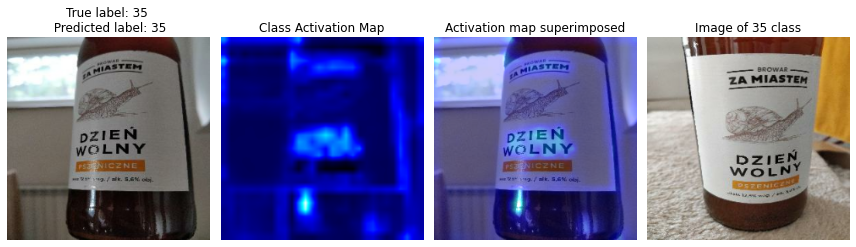

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


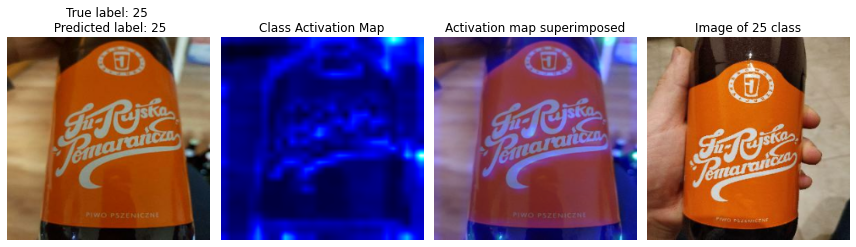

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


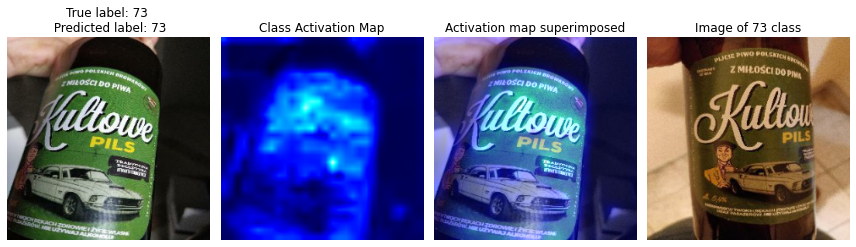

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


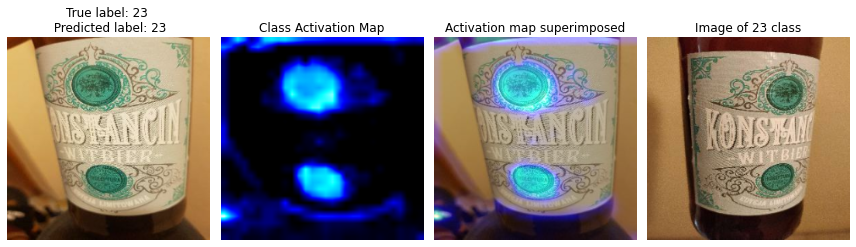

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


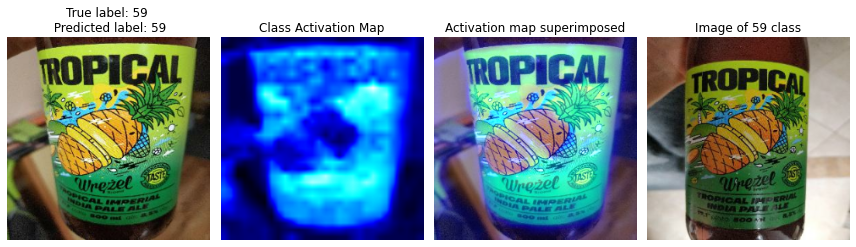

In [112]:
displayed_img_count = 0

for i in range(530):

    if np.argmax(y_pred[i]) == y_true[i]:
        
        image = full_test_ds[0][i]
        true_label = y_true[i]
        
        if displayed_img_count < 5:
            show_gradcam(image, true_label, every_class_img)
        displayed_img_count += 1

In [50]:
# clear data 
# del full_test_ds, test_ds, train_ds, val_dir, validation_ds, every_class_img

# Conclusion



Designed model  with accuracy almost 92% on dataset. The most wrong predictions in one class was for labels from "Browar Za Miastem" brewery (animal in the middle).

Best way to improve the model and make is more uniform (to be usable in images from different distributions) would be implementing data augmentation.

It would be highly recommended to check if random_contrast may make possible detection of the animal in labels mentioned above.

In [113]:
os.system('jupyter nbconvert --to html Tabaka_Marcin_analiza_bledow.ipynb')

0